In [90]:
import sys
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split

sys.path.insert(1, '../')

from rule_extraction import *

%load_ext autoreload
%autoreload 2
%matplotlib widget

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [91]:
dataPairs = []

directories = []
for root, dirs, files in os.walk("../../data/data-cluster-examples-pause"):
    for name in dirs:
        directories.append(os.path.join(root, name))


for directory in directories:
    print(f"Processing {directory}")

    # if "fallingDrop" not in directory:
    #     print(f"Skipping {directory}")
    #     continue

    files = os.listdir(directory)

    # group files by time AutoPas_liveInfoLogger_Rank0_$2024-05-21_14-24-17$
    data_pairs = {}
    for file in files:
        if "tuningData" in file or "liveInfo" in file:
            time = file.split("_")[-1]

            if not time in data_pairs:
                data_pairs[time] = [None, None]

            if "tuningData" in file:
                data_pairs[time][1] = pd.read_csv(
                    os.path.join(directory, file))
            elif "liveInfo" in file:
                data_pairs[time][0] = pd.read_csv(
                    os.path.join(directory, file))

    # check if tuning and liveInfo files are present
    for time, pair in data_pairs.items():
        if pair[0] is None or pair[1] is None:
            print(f"Missing file for {directory} at time {time}")
            continue

    # filter rows where NaN is present

    for time, (liveInfo, tuningData) in data_pairs.items():
        tuning_iterations = tuningData["Iteration"]

        corresponding_liveInfo = liveInfo.loc[liveInfo["Iteration"].isin(
            tuning_iterations)]

        # assert len(corresponding_liveInfo) == len(
        #     tuningData), "Length of liveInfo and tuningData does not match"

        # strip columns
        corresponding_liveInfo.columns = corresponding_liveInfo.columns.str.strip()
        tuningData.columns = tuningData.columns.str.strip()

        # merge container and Data Layout
        tuningData["ContainerDataLayout"] = tuningData["Container"] + \
            "_" + tuningData["Data Layout"]

        # tuningData.drop(columns=["Container", "Data Layout"], inplace=True)

        dataPairs.append((corresponding_liveInfo, tuningData))

        # describe data
        # print(f"Time: {time}")
        # print(corresponding_liveInfo["avgParticlesPerCell"].describe())
        # print("")

Processing ../../data/data-cluster-examples-pause/uniformCube_b_1
Processing ../../data/data-cluster-examples-pause/uniformCube_b_2
Processing ../../data/data-cluster-examples-pause/fallingDrop_2
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_1
Processing ../../data/data-cluster-examples-pause/uniform_cube_a_2
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_1
Processing ../../data/data-cluster-examples-pause/fallingDrop_1
Processing ../../data/data-cluster-examples-pause/uniform_cube_a_1
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_2
Processing ../../data/data-cluster-examples-pause/explodingLiquid_2
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_2
Processing ../../data/data-cluster-examples-pause/explodingLiquid_1


# Load Data from Folders


In [92]:
df = pd.DataFrame()

for batch, (X, y) in enumerate(dataPairs):
    merged = pd.merge(X, y, on="Iteration")
    df = pd.concat([df, merged])

df = df.drop(columns=["Iteration", "Date_x", "Date_y"])
df = df.drop(list(df.filter(regex='sample')), axis=1)
df.shape

(180529, 30)

In [93]:
df.describe()

df.head(10)

,avgParticlesPerCell,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,homogeneity,maxDensity,maxParticlesPerCell,minParticlesPerCell,...,threadCount,Container,CellSizeFactor,Traversal,Load Estimator,Data Layout,Newton 3,Reduced,Smoothed,ContainerDataLayout
0,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c01,none,AoS,disabled,24865061.0,24865061.0,LinkedCells_AoS
1,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c01,none,SoA,disabled,23562237.0,23562237.0,LinkedCells_SoA
2,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c04,none,AoS,disabled,21146112.0,21146112.0,LinkedCells_AoS
3,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c04,none,AoS,enabled,15197963.0,15197963.0,LinkedCells_AoS
4,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c04,none,SoA,disabled,20797731.0,20797731.0,LinkedCells_SoA
5,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c04,none,SoA,enabled,14694327.0,14694327.0,LinkedCells_SoA
6,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c08,none,AoS,disabled,22249829.0,22249829.0,LinkedCells_AoS
7,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c08,none,AoS,enabled,15956014.0,15956014.0,LinkedCells_AoS
8,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c08,none,SoA,disabled,21856472.0,21856472.0,LinkedCells_SoA
9,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,28,LinkedCells,1.0,lc_c08,none,SoA,enabled,16231986.0,16231986.0,LinkedCells_SoA


In [94]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'Container', 'CellSizeFactor', 'Traversal', 'Load Estimator',
       'Data Layout', 'Newton 3', 'Reduced', 'Smoothed',
       'ContainerDataLayout'],
      dtype='object')

# Define Interesting Data to observe


In [95]:
inputs = [
    "avgParticlesPerCell",
    # "cutoff",
    # "domainSizeX",
    # "domainSizeY",
    # "domainSizeZ",
    # "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    # "minParticlesPerCell",
    # "numCells",
    # "numEmptyCells",
    # "numHaloParticles",
    # "numParticles",
    # "particleSize",
    # "particleSizeNeededByFunctor",
    # "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    # "rebuildFrequency",
    # "skin",
    "threadCount",
]

outputs = [
    "ContainerDataLayout",
    # "Container",
    # "Data Layout",
    # "CellSizeFactor",
    "Traversal",
    # "Load Estimator",
    "Newton 3",
]

In [96]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'Container', 'CellSizeFactor', 'Traversal', 'Load Estimator',
       'Data Layout', 'Newton 3', 'Reduced', 'Smoothed',
       'ContainerDataLayout'],
      dtype='object')

In [97]:
group_by = [
    "avgParticlesPerCell",
    "cutoff",
    "domainSizeX",
    "domainSizeY",
    "domainSizeZ",
    "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    "minParticlesPerCell",
    "numCells",
    "numEmptyCells",
    "numHaloParticles",
    "numParticles",
    "particleSize",
    "particleSizeNeededByFunctor",
    "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    "rebuildFrequency",
    "skin",
    "threadCount",
]


# only keep rows where performance percentage is above x
print("Orignal length", len(df))

# group data on input columns
grouped = df.groupby(group_by)


def add_Speedup_column(group):
    min_smoothed = group['Smoothed'].min()
    result = group.copy()
    result['speedup'] = min_smoothed / result['Smoothed']
    return result


grouped_speedup = grouped.apply(
    add_Speedup_column).reset_index(drop=True)

grouped_speedup.drop(columns=["Smoothed", "Reduced"], inplace=True)

#ungroup
data=grouped_speedup.reset_index(drop=True)


Orignal length 180529


/tmp/ipykernel_97443/810863334.py:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_speedup = grouped.apply(


In [98]:
Z_THRESHHOLD = 3
for column in inputs:
    z = np.abs(stats.zscore(data[column]))
    data = data[z < Z_THRESHHOLD]

print("Outliers removed length", len(data))


# filter values occuring less than pct
SPARSE_CUTOFF = 0.01
for column in outputs:
    counts = data[column].value_counts()

    sparse_values = data[column].isin(
        counts[counts > len(data) * SPARSE_CUTOFF].index)

    data = data[sparse_values]


print("Sparse values removed length", len(data))



Outliers removed length 167440
Sparse values removed length 159600


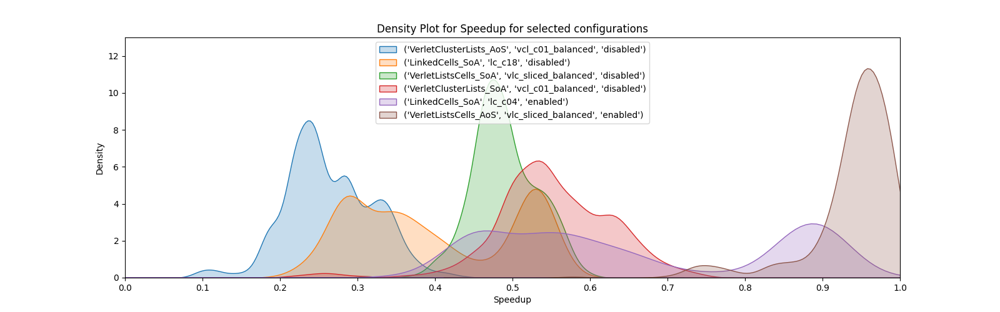

In [99]:
#sort group on outputs and order groups by mean speedup
data_group_output = data.groupby(outputs)

best_configs=[]

for group in data_group_output:
    group_name = group[0]
    group_data = group[1]

    best_configs.append((group_data["speedup"].mean(), group))

best_configs.sort(key=lambda x: x[0], reverse=False)
# remove speedup
best_configs = [x[1] for x in best_configs]


#drop index


#make plot for best configurations
fig, ax = plt.subplots(1, 1, figsize=(16, 5))

   
for i, group in enumerate(best_configs):
        # ignore bin at 1
        filtered = group[1].loc[group[1]["speedup"] != 1]

        config=(group[0][0], group[0][1], group[0][2])

        if len(filtered) <=2:
            continue

        if i % 10 != 0 and not (i == len(best_configs)-1 or i==0):
            continue
        sns.kdeplot(filtered["speedup"], ax=ax, label=config, cut=10, bw_adjust=1, fill=True)
    
ax.set_xlim(0, 1)
ax.set_ylim(0, 13)


# only 0.2 steps on x-axis
ax.set_xticks(np.linspace(0, 1, 11))

ax.set_title("Density Plot for Speedup for selected configurations")
ax.set_xlabel("Speedup")
ax.set_ylabel("Density")
ax.legend(loc='upper center')


# Create Train and Test Data


In [100]:
relevantData=data[inputs+outputs+["speedup"]]

X_train, X_test, y_train, y_test = train_test_split(
    relevantData.drop(columns=["speedup"]), pd.DataFrame(relevantData["speedup"])
    , test_size=0.2, random_state=42)

# save to csv
pd.concat([X_train, y_train], axis=1).to_pickle("train.pkl")
pd.concat([X_test, y_test], axis=1).to_pickle("test.pkl")

# Final Data


In [101]:
pd.concat([X_train, y_train], axis=1).head()

,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,threadCount,ContainerDataLayout,Traversal,Newton 3,speedup
49450,0.905797,0.035496,0.531948,23,0.012989,1,LinkedCells_AoS,lc_sliced,enabled,0.450641
167724,2.201487,0.086152,0.627706,13,0.014430,24,VerletListsCells_AoS,vlc_sliced_balanced,disabled,0.594117
92462,0.905797,0.043115,0.319169,18,0.013617,4,LinkedCells_AoS,lc_sliced_c02,enabled,0.454632
151117,0.944637,0.083797,0.691920,22,0.040474,28,VerletClusterLists_AoS,vcl_c06,disabled,0.319094
91781,0.905797,0.043133,0.315623,19,0.013579,28,VerletListsCells_AoS,vlc_sliced_c02,disabled,0.673052


# Train Decision Tree and Extract Rules


In [102]:
# number of input parameters that can be used simultaneously
POSSIBLE_NUMBER_OF_COMBINATIONS = [2, 3, 4, 5]


from collections import defaultdict 
CCP_ALPHA = defaultdict(lambda: 0.05)

# maximum depth of the decision tree
MAX_DEPTH = 10

# how many models should be created for each label
TOP_K_MODELS_PER_LABEL = 1


In [103]:
# go through all batches of grouped train data

SUITABILITY_LABELS = ["terrible", "rubbish", "bad", "medium", "ok", "good", "excellent"]

In [104]:
auto_rules:dict = {}

output_variables=[]

print("Number of configs", len(X_train.groupby(outputs)))

for config, group in pd.concat([X_train, y_train], axis=1).groupby(outputs):
    #join tuple 
    name = "Suitability "+ "_".join([str(v) for c, v in zip(outputs, config)])

    data=group[inputs]
    pred=group["speedup"]

    # add category column to y train based on speedup

    def mapping(value):
        label= SUITABILITY_LABELS[min(int(value * len(SUITABILITY_LABELS)), len(SUITABILITY_LABELS)-1)]
        return f"{label}"

    y_train_labels=pd.DataFrame()
    y_train_labels[name]=pred.apply(mapping)

    output_variables.append(name)


    new_rules = create_auto_rules(data, y_train_labels, None,
                               POSSIBLE_NUMBER_OF_COMBINATIONS, CCP_ALPHA, MAX_DEPTH, TOP_K_MODELS_PER_LABEL,plot=False)

    auto_rules.update(new_rules)


Number of configs 50
Training on 2511 samples
Suitability LinkedCells_AoS_lc_c01_disabled: ['homogeneity', 'maxDensity', 'particlesPerCellStdDev', 'threadCount'] (score=0.95)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c01_disabled (10 rules)
Training on 2550 samples
Suitability LinkedCells_AoS_lc_c04_disabled: ['homogeneity', 'maxDensity', 'maxParticlesPerCell', 'threadCount'] (score=0.76)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c04_disabled (10 rules)
Training on 2536 samples
Suitability LinkedCells_AoS_lc_c04_enabled: ['maxDensity', 'threadCount'] (score=0.86)
Number of rules 5:
	Suitability LinkedCells_AoS_lc_c04_enabled (5 rules)
Training on 2527 samples
Suitability LinkedCells_AoS_lc_c08_disabled: ['particlesPerCellStdDev', 'threadCount'] (score=0.84)
Number of rules 4:
	Suitability LinkedCells_AoS_lc_c08_disabled (4 rules)
Training on 2499 samples
Suitability LinkedCells_AoS_lc_c08_enabled: ['avgParticlesPerCell', 'homogeneity', 'maxDensity', 'threadCount'] (

threadCount: [-inf, 1.678, 1.737, 1.84, 2.314, 2.46, 2.5, 2.569, 2.635, 2.695, 3.257, 3.603, 3.824, 4.141, 5.361, 6.252, 6.361, 7.951, 8.0, 9.891, 11.461, 11.704, 11.933, 11.952, 12.219, 12.273, 12.36, 12.585, 12.807, 16.072, 16.254, 18.0, 18.041, 21.23, 22.11, 24.347, 25.017, 25.62, 26.0, 26.246, 27.211, inf]
threadCount: [-inf, 1.678, 1.84, 2.314, 2.46, 2.635, 3.257, 3.603, 3.824, 4.141, 5.361, 6.252, 7.951, 9.891, 11.461, 11.704, 11.933, 12.219, 12.36, 12.585, 12.807, 16.072, 16.254, 18.0, 21.23, 22.11, 24.347, 25.017, 25.62, 26.0, 26.246, 27.211, inf]

particlesPerCellStdDev: [-inf, 0.009, 0.011, 0.013, 0.014, 0.015, 0.016, 0.018, 0.019, 0.02, 0.021, 0.023, 0.024, 0.025, 0.029, 0.034, 0.036, 0.037, 0.04, 0.041, 0.042, 0.043, 0.044, 0.045, inf]
particlesPerCellStdDev: [-inf, 0.009, 0.011, 0.013, 0.014, 0.015, 0.016, 0.018, 0.019, 0.02, 0.021, 0.023, 0.024, 0.025, 0.029, 0.034, 0.036, 0.037, 0.04, 0.041, 0.042, 0.043, 0.044, 0.045, inf]

maxDensity: [-inf, 0.113, 0.118, 0.137, 0.17, 

/home/manuel/Documents/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/../demo/fuzzy-test/python/fuzzy_system.py:409: RuntimeWarning: overflow encountered in exp
  def function(x): return 1 / (1 + np.exp(-width * (x - center)))


delta_x = 0.0870972097392018, number of points = 5.579972096181351, should be at least 10
delta_x = 0.0870972097392018, number of points = 6.027747634763791, should be at least 10
delta_x = 0.0870972097392018, number of points = 7.612184155901692, should be at least 10
delta_x = 0.0870972097392018, number of points = 8.369958144272006, should be at least 10
delta_x = 0.0870972097392018, number of points = 7.8877383334908835, should be at least 10
delta_x = 0.0870972097392018, number of points = 9.851061848813941, should be at least 10
delta_x = 0.0870972097392018, number of points = 4.856642380009708, should be at least 10
delta_x = 0.0870972097392018, number of points = 7.646628428100323, should be at least 10
delta_x = 0.0870972097392018, number of points = 6.268857540154423, should be at least 10
delta_x = 0.0870972097392018, number of points = 8.47329096086796, should be at least 10
delta_x = 0.0016588289796319856, number of points = 7.234018785144453, should be at least 10
delta_x

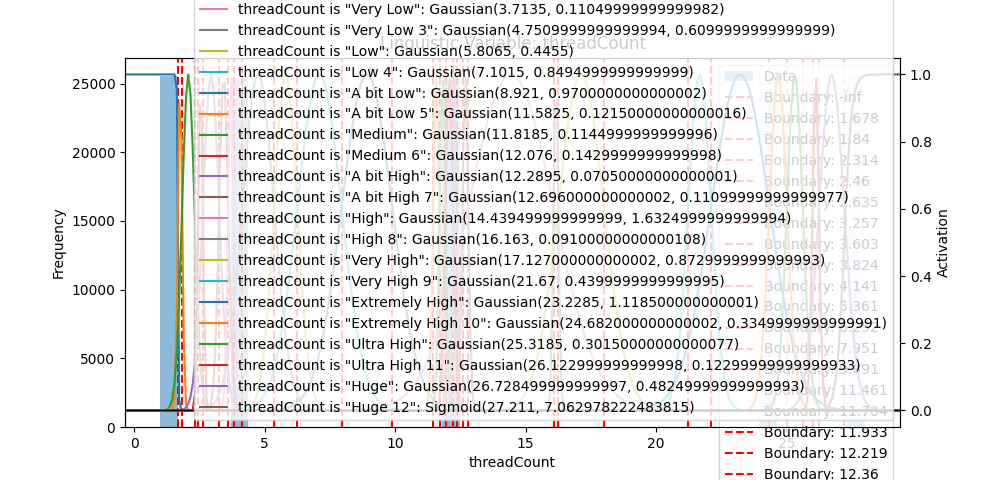

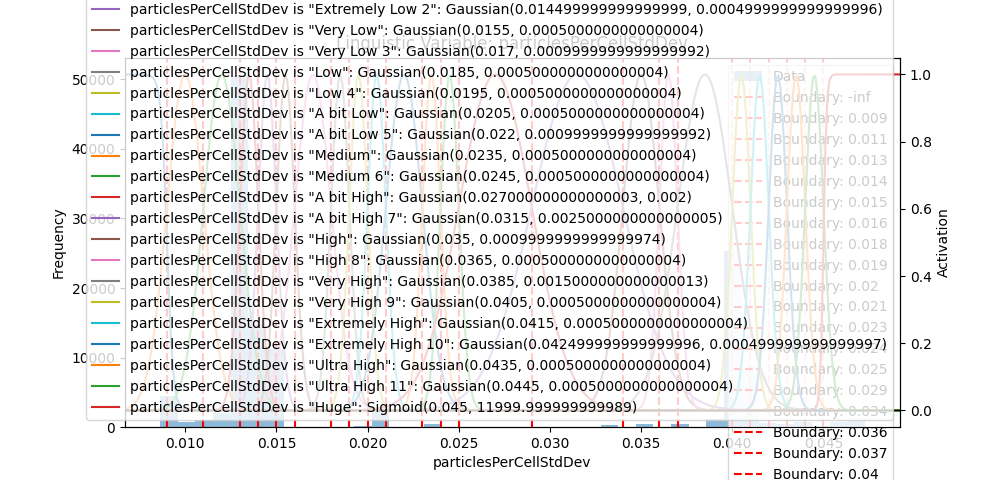

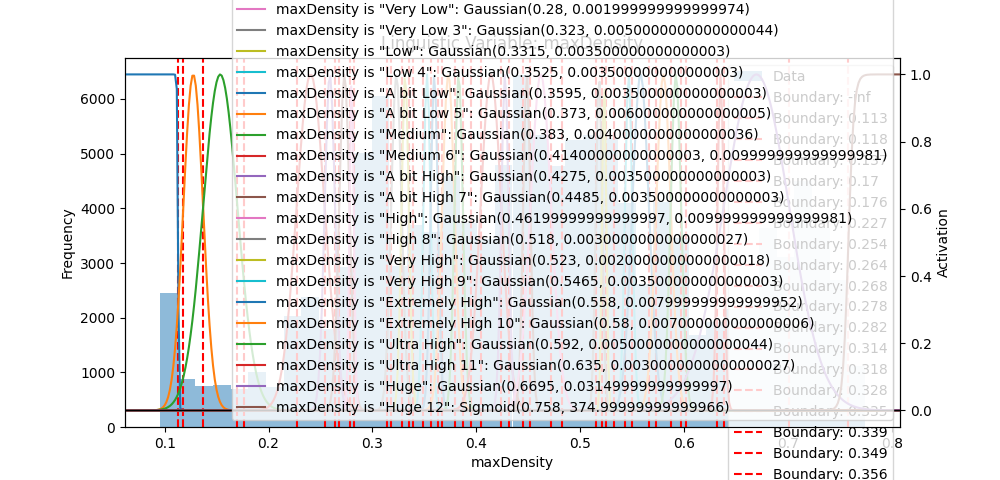

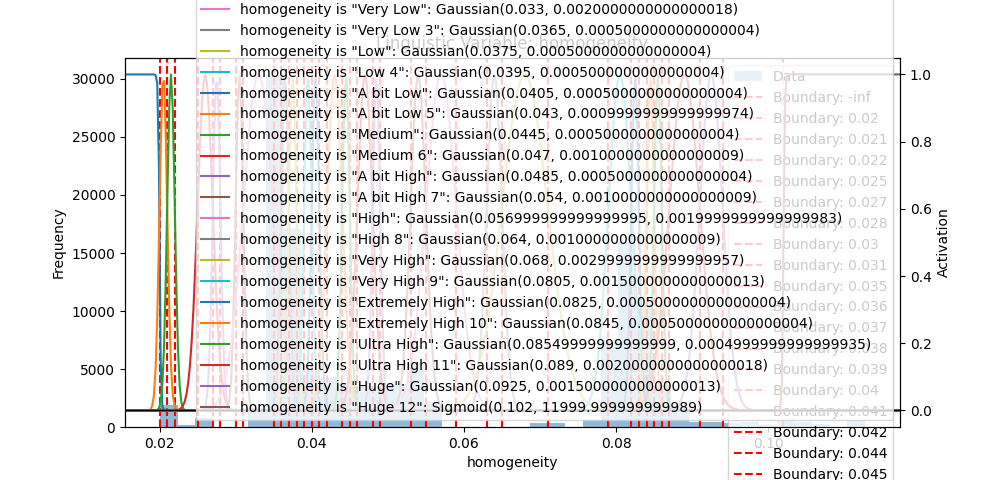

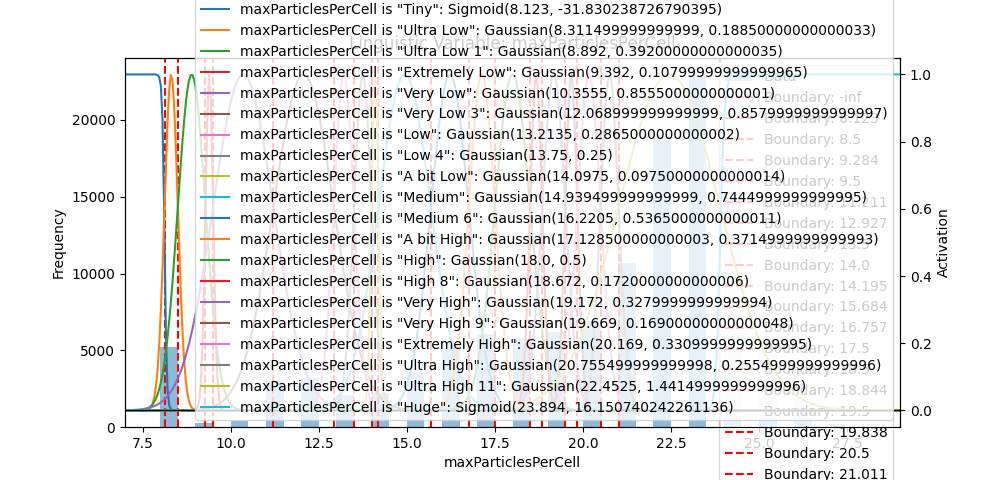

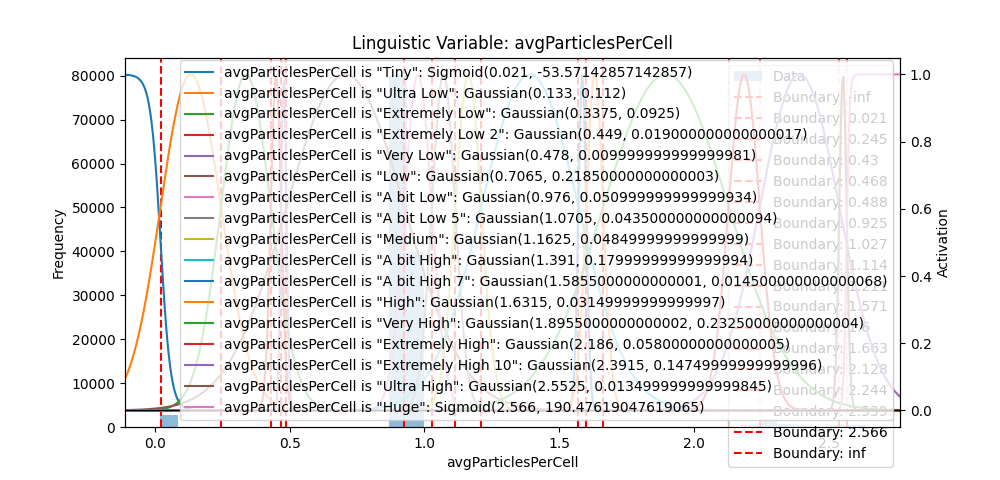

In [105]:
inputs_approach1, rules_approach1 = create_rules_approach1(
    X_train, auto_rules)

# Aproach 2

Follows https://www.sciencedirect.com/science/article/pii/S0165011406002533


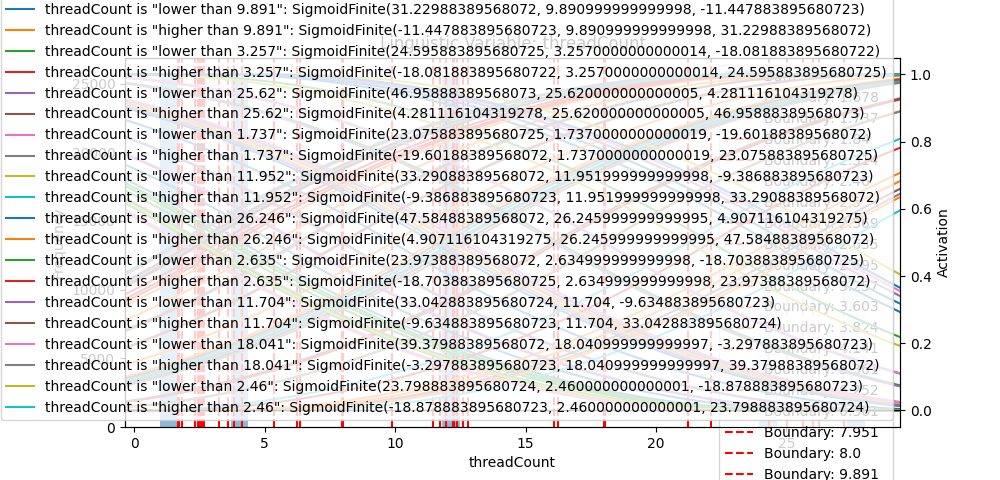

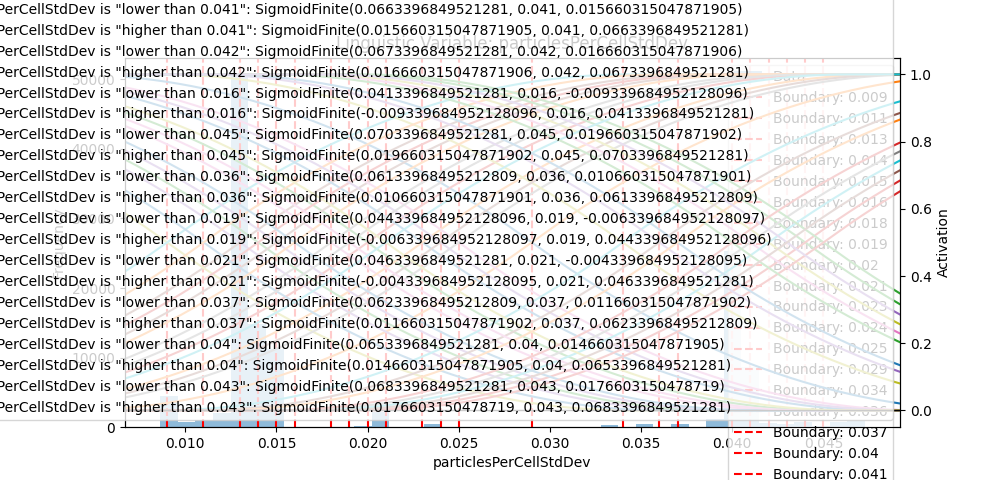

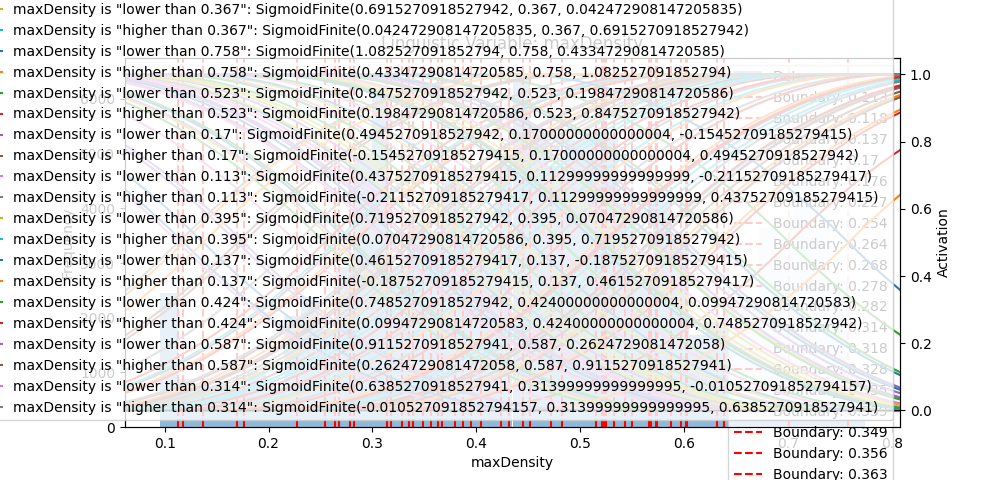

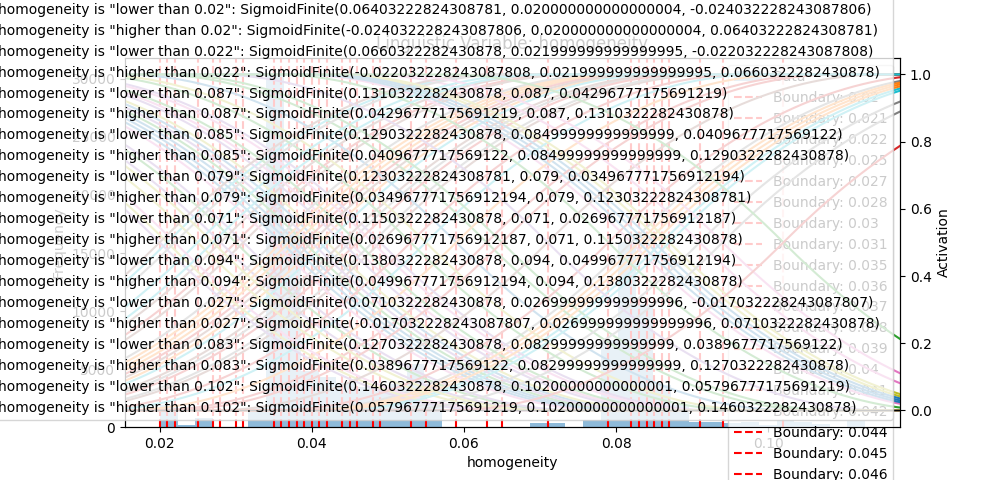

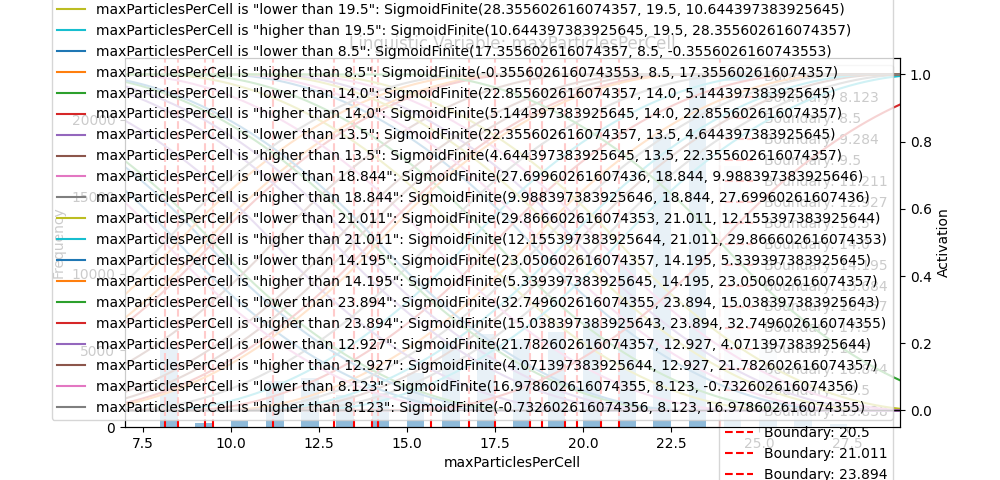

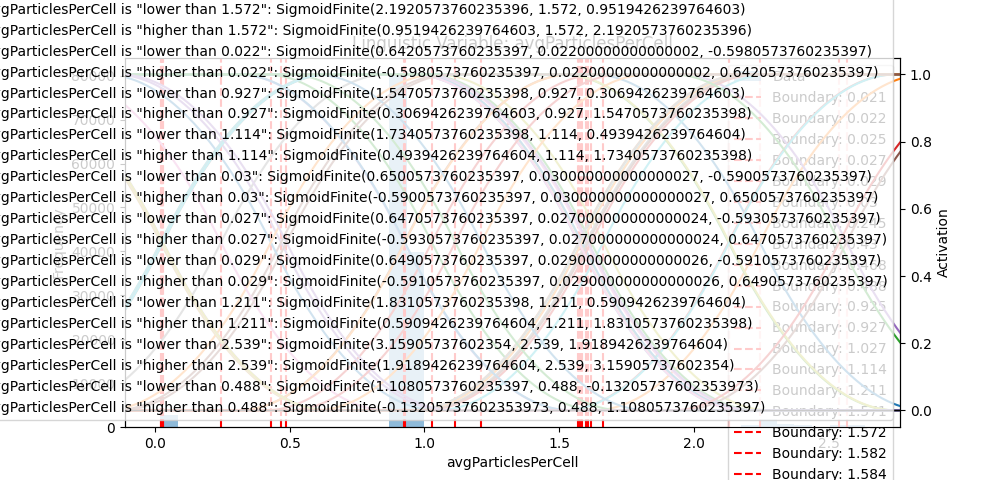

In [106]:
inputs_approach_2, rules_approach2 = create_rules_approach2(
    X_train, auto_rules)

In [115]:
def make_direct_output_membership_functions(output_variables):
    outputRangeMembershipFunctions: dict[str, LinguisticVariable] = {}

    for col in output_variables:

        split_values = SUITABILITY_LABELS


        base_set = Set(Set.SetType.CONTINUOUS, (0, 1))
        crisp_set = CrispSet({(col, base_set)})

        outputRangeMembershipFunctions[col] = LinguisticVariable(crisp_set)

        for i, entry in enumerate(split_values):
            spacing = 1/(len(split_values)+1)
            mean = (i+1)*spacing
            std = (spacing/len(split_values))
            outputRangeMembershipFunctions[col].add_linguistic_term(
                Gaussian(entry, mean, std))

    return outputRangeMembershipFunctions

outputRangeMembershipFunctions = make_direct_output_membership_functions(output_variables)


In [117]:
display(rules_to_table(rules_approach2, "Approach 2"))

/home/manuel/Documents/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/cluster-examples-pause-suitability/../rule_extraction.py:939: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table = table.applymap(
/home/manuel/Documents/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/cluster-examples-pause-suitability/../rule_extraction.py:942: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table.set_caption(name)


# Save all the data


In [118]:
save_linguistic_variables(inputs_approach1, "approach1/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach1/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach1, "approach1/fuzzy-rules.txt")


save_linguistic_variables(inputs_approach_2, "approach2/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach2/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach2, "approach2/fuzzy-rules.txt")